In [34]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, cross_validate, RandomizedSearchCV
from sklearn.metrics import r2_score, accuracy_score, confusion_matrix
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
import statistics as stats

Source: https://archive.ics.uci.edu/ml/datasets/Urban+Land+Cover

Data Set Information:

Contains training and testing data for classifying a high resolution aerial image into 9 types of urban land cover. Multi-scale spectral, size, shape, and texture information are used for classification.

Class is the target classification variable. The land cover classes are: trees, grass, soil, concrete, asphalt, buildings, cars, pools, shadows.


Attribute Information:

LEGEND
Class: Land cover class (nominal)
BrdIndx: Border Index (shape variable)
Area: Area in m2 (size variable)
Round: Roundness (shape variable)
Bright: Brightness (spectral variable)
Compact: Compactness (shape variable)
ShpIndx: Shape Index (shape variable)
Mean_G: Green (spectral variable)
Mean_R: Red (spectral variable)
Mean_NIR: Near Infrared (spectral variable)
SD_G: Standard deviation of Green (texture variable)
SD_R: Standard deviation of Red (texture variable)
SD_NIR: Standard deviation of Near Infrared (texture variable)
LW: Length/Width (shape variable)
GLCM1: Gray-Level Co-occurrence Matrix [i forget which type of GLCM metric this one is] (texture variable)
Rect: Rectangularity (shape variable)
GLCM2: Another Gray-Level Co-occurrence Matrix attribute (texture variable)
Dens: Density (shape variable)
Assym: Assymetry (shape variable)
NDVI: Normalized Difference Vegetation Index (spectral variable)
BordLngth: Border Length (shape variable)
GLCM3: Another Gray-Level Co-occurrence Matrix attribute (texture variable)

Note: These variables repeat for each coarser scale (i.e. variable_40, variable_60, ...variable_140).

In [2]:
testing = pd.read_csv("testing.csv")
training = pd.read_csv("training.csv")

In [3]:
testing.shape

(507, 148)

In [4]:
training.shape

(168, 148)

It is weird that the training set is smaller than the test set. I will bring them together and separate them myself.

In [5]:
data = pd.concat([testing,training]).reset_index(drop=True)

In [6]:
data

,class,BrdIndx,Area,Round,Bright,Compact,ShpIndx,Mean_G,Mean_R,Mean_NIR,...,SD_NIR_140,LW_140,GLCM1_140,Rect_140,GLCM2_140,Dens_140,Assym_140,NDVI_140,BordLngth_140,GLCM3_140
0,concrete,1.32,131,0.81,222.74,1.66,2.18,192.94,235.11,240.15,...,31.15,5.04,0.80,0.58,8.56,0.82,0.98,-0.10,1512,1287.52
1,shadow,1.59,864,0.94,47.56,1.41,1.87,36.82,48.78,57.09,...,12.01,3.70,0.52,0.96,7.01,1.69,0.86,-0.14,196,2659.74
2,shadow,1.41,409,1.00,51.38,1.37,1.53,41.72,51.96,60.48,...,18.75,3.09,0.90,0.63,8.32,1.38,0.84,0.10,1198,720.38
3,tree,2.58,187,1.91,70.08,3.41,3.11,93.13,55.20,61.92,...,27.67,6.33,0.89,0.70,8.56,1.10,0.96,0.20,524,891.36
4,asphalt,2.60,116,2.05,89.57,3.06,3.02,73.17,94.89,100.64,...,32.05,1.01,0.83,0.75,8.62,2.08,0.08,-0.10,496,1194.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
670,car,1.43,39,1.41,234.03,1.54,1.60,206.36,246.05,249.69,...,55.92,1.73,0.65,0.81,7.05,1.89,0.42,-0.10,66,2469.69
671,soil,1.92,141,1.24,215.19,2.02,2.02,212.28,216.28,217.00,...,18.91,3.49,0.88,0.67,7.88,1.44,0.82,0.06,990,824.01
672,grass,2.97,252,1.73,164.13,3.20,3.09,184.15,152.03,156.22,...,33.52,2.02,0.86,0.71,8.50,1.82,0.54,0.06,948,821.84
673,grass,1.57,216,1.27,164.84,1.71,1.97,192.55,148.34,153.62,...,24.49,1.13,0.76,0.85,7.75,2.11,0.30,0.09,254,1580.72


In [7]:
ProfileReport(data,minimal=True)

<AxesSubplot:>

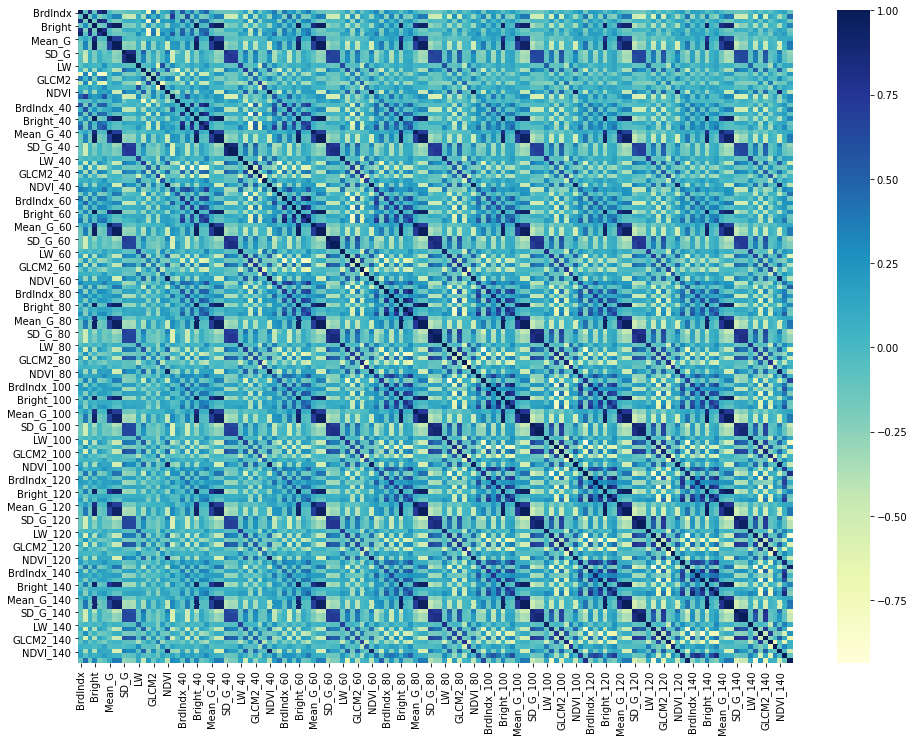

In [8]:
plt.figure(figsize=(16,12))
sns.heatmap(data.corr(),cmap= "YlGnBu")

In [9]:
y = data["class"]
le = LabelEncoder()
y = le.fit_transform(y)
pd.Series(y).value_counts()

1    122
3    116
4    112
8    106
6     61
0     59
2     36
7     34
5     29
dtype: int64

There is some class imbalance problem, even more than 3:1

In [10]:
X = data.drop("class",1)

In [11]:
X.shape

(675, 147)

In [12]:
y.shape

(675,)

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

#  Lasso

In [14]:
print("Original")
lasso_model_original = Lasso().fit(X_train,y_train)
lasso_prediction_original = lasso_model_original.predict(X_test)
print("R2 score: ", r2_score(y_test,lasso_prediction_original<lasso_prediction_original.mean()))

Original
R2 score:  -1.8442055631338592


In [15]:
print("Manual")
lasso_model_manual = Lasso(alpha = 0.5).fit(X_train,y_train)
lasso_prediction_manual = lasso_model_manual.predict(X_test)
print("R2 score: ", r2_score(y_test,lasso_prediction_original<lasso_prediction_original.mean()))

Manual
R2 score:  -1.8442055631338592


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0765795804697973, tolerance: 0.3044867256637168
  model = cd_fast.enet_coordinate_descent(


In [16]:
lasso_grid_search = {'alpha': list(np.linspace(0, 0.5, 6, dtype=float))}

lasso_model_grid = GridSearchCV(estimator=Lasso(), param_grid = lasso_grid_search,
                                     cv=5, n_jobs=-1,return_train_score = True)
lasso_model_grid.fit(X_train, y_train)

print("Grid")
print("Best alpha: ", lasso_model_grid.best_estimator_.alpha)
lasso_prediction_grid = lasso_model_grid.best_estimator_.predict(X_test)
print("R2 score: ", r2_score(y_test,lasso_prediction_grid))

Grid
Best alpha:  0.30000000000000004
R2 score:  0.406493394070645


/opt/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:529: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 7.794984044413468, tolerance: 0.3044867256637168
  model = cd_fast.enet_coordinate_descent(


In [17]:
results = pd.DataFrame(lasso_model_grid.cv_results_)
results["mean_train_score"]

0    0.729578
1    0.585879
2    0.581797
3    0.577341
4    0.571594
5    0.565981
Name: mean_train_score, dtype: float64

In [18]:
results["mean_test_score"]

0    0.185374
1    0.449434
2    0.455483
3    0.455747
4    0.453314
5    0.450148
Name: mean_test_score, dtype: float64

It seems like there is some overfitting. The train scores are considerably higher than test scores.

# Decision Tree 

In [19]:
print("Original")
dt_model_original = DecisionTreeClassifier().fit(X_train,y_train)
dt_prediction_original = dt_model_original.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,dt_prediction_original))

Original
Accuracy score:  0.7668161434977578


In [20]:
print("Manual")
dt_model_manual = DecisionTreeClassifier(min_samples_leaf = 6 ,ccp_alpha = 0).fit(X_train,y_train)
dt_prediction_manual = dt_model_manual.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,dt_prediction_manual))

Manual
Accuracy score:  0.7847533632286996


In [21]:
dt_grid_search = {'min_samples_leaf': list(np.linspace(1, 10, 6, dtype=int)),
                 'ccp_alpha': list(np.linspace(0, 1, 6, dtype=float))}

dt_model_grid = GridSearchCV(estimator=DecisionTreeClassifier(), param_grid = dt_grid_search,
                                     verbose = 5,cv=5, n_jobs=-1,return_train_score = True)
dt_model_grid.fit(X_train, y_train)

print("Grid")
print("Best min_samples_leaf: ", dt_model_grid.best_estimator_.min_samples_leaf)
print("Best ccp_alpha: ", dt_model_grid.best_estimator_.ccp_alpha)
dt_prediction_grid = dt_model_grid.best_estimator_.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,dt_prediction_grid))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s


Grid
Best min_samples_leaf:  4
Best ccp_alpha:  0.0
Accuracy score:  0.7713004484304933


[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:    1.3s finished


In [22]:
results = pd.DataFrame(dt_model_grid.cv_results_)
results["mean_train_score"].head(5)

0    1.000000
1    0.967368
2    0.935293
3    0.919798
4    0.904316
Name: mean_train_score, dtype: float64

In [23]:
results["mean_test_score"].head(5)

0    0.765372
1    0.769817
2    0.796386
3    0.794164
4    0.760952
Name: mean_test_score, dtype: float64

The best "the minimal number of observations per tree leaf" is 4 and best complexity is 0.0.
The accuracy score is better, however there is still some overfitting.

# Random Forest

In [24]:
print("Original")
rf_model_original = RandomForestClassifier().fit(X_train,y_train)
rf_prediction_original = rf_model_original.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,rf_prediction_original))

Original
Accuracy score:  0.852017937219731


In [25]:
print("Manual")
rf_model_manual = RandomForestClassifier(n_estimators = 500, min_samples_leaf = 5, max_samples = 50).fit(X_train,y_train)
rf_prediction_manual = rf_model_manual.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,rf_prediction_manual))

Manual
Accuracy score:  0.7354260089686099


In [26]:
rf_grid_search = {'max_samples': list(np.linspace(200, 300, 6, dtype=int))}

rf_model_grid = GridSearchCV(estimator=RandomForestClassifier(n_estimators = 500, min_samples_leaf = 5), param_grid = rf_grid_search,
                                     verbose = 5,cv=5, n_jobs=-1,return_train_score = True)
rf_model_grid.fit(X_train, y_train)

print("Grid")
print("Best max_samples: ", rf_model_grid.best_estimator_.max_samples)
rf_prediction_grid = rf_model_grid.best_estimator_.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,rf_prediction_grid))

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done  22 out of  30 | elapsed:    4.9s remaining:    1.8s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    6.4s finished


Grid
Best max_samples:  280
Accuracy score:  0.8161434977578476


In [27]:
results = pd.DataFrame(rf_model_grid.cv_results_)
results["mean_train_score"]

0    0.916478
1    0.925878
2    0.928644
3    0.935287
4    0.940815
5    0.944133
Name: mean_train_score, dtype: float64

In [28]:
results["mean_test_score"]

0    0.847375
1    0.845153
2    0.849597
3    0.851795
4    0.851819
5    0.845177
Name: mean_test_score, dtype: float64

Although there is still some overfitting, these are the best results so far!

I believe the result could be further improved by searching better values for n_estimators.

# Stochastic Gradient Boosting

In [29]:
print("Original")
gb_model_original = GradientBoostingClassifier().fit(X_train,y_train)
gb_prediction_original = gb_model_original.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,gb_prediction_original))

Original
Accuracy score:  0.8295964125560538


In [30]:
print("Manual")
gb_model_manual = GradientBoostingClassifier(learning_rate = 0.01, n_estimators = 200, max_depth = 5).fit(X_train,y_train)
gb_prediction_manual = gb_model_manual.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,gb_prediction_manual))

Manual
Accuracy score:  0.7937219730941704


In [31]:
gb_grid_search = {'max_depth': list(np.linspace(1, 13, 6, dtype=int)),
                  'learning_rate': [0.01, 0.1,  0.2],
                  'n_estimators': list(np.linspace(75, 200, 5, dtype=int))}

gb_model_grid = GridSearchCV(estimator=GradientBoostingClassifier(), param_grid = gb_grid_search,
                                     verbose = 5,cv=5, n_jobs=-1,return_train_score = True)
gb_model_grid.fit(X_train, y_train)

print("Grid")
print("Best max_depth: ", gb_model_grid.best_estimator_.max_depth)
print("Best learning_rate: ", gb_model_grid.best_estimator_.learning_rate)
print("Best n_estimators: ", gb_model_grid.best_estimator_.n_estimators)
gb_prediction_grid = gb_model_grid.best_estimator_.predict(X_test)
print("Accuracy score: ", accuracy_score(y_test,gb_prediction_grid))

Fitting 5 folds for each of 90 candidates, totalling 450 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed: 23.9min
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed: 55.5min
[Parallel(n_jobs=-1)]: Done 450 out of 450 | elapsed: 64.2min finished


Grid
Best max_depth:  5
Best learning_rate:  0.2
Best n_estimators:  200
Accuracy score:  0.8565022421524664


In [35]:
results = pd.DataFrame(gb_model_grid.cv_results_)
results[results["rank_test_score"] <= 5]["mean_train_score"]

65    1.0
67    1.0
70    1.0
71    1.0
74    1.0
Name: mean_train_score, dtype: float64

In [37]:
results[results["rank_test_score"] <= 5]["mean_test_score"]

65    0.860488
67    0.858242
70    0.858364
71    0.864982
74    0.865031
Name: mean_test_score, dtype: float64

There is some overfitting, however the results are improved even further.

The best results are found with GradientBoost model.

Feature selection could improve these results.

Let's check the confusion matrix of best model.

In [38]:
confusion_matrix(y_test, gb_prediction_grid)

array([[13,  2,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 41,  2,  3,  0,  0,  0,  0,  0],
       [ 0,  0, 12,  1,  0,  0,  0,  0,  0],
       [ 0,  3,  0, 31,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 27,  0,  0,  0,  7],
       [ 0,  0,  0,  0,  1, 12,  0,  0,  0],
       [ 4,  0,  0,  0,  0,  0, 15,  0,  0],
       [ 0,  2,  0,  2,  0,  0,  0, 10,  0],
       [ 0,  1,  0,  0,  4,  0,  0,  0, 30]])